# Convolutional Neural Network

### Libraries

In [18]:
# import libraries

import os
import cv2
import torch

import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F
import multiprocessing

from xml.etree import ElementTree as ET
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torch import nn
from PIL import Image
from tqdm import tqdm
from sklearn.metrics import accuracy_score

### Datasets

In [19]:
# major variables

photos_dir = './photos'
renders_dir = './renders'



In [20]:
def parse_xml(xml_file):
    '''
    Read the xml file and return the bounding box coordinates
    '''
    tree = ET.parse(xml_file)
    root = tree.getroot()
    bounding_boxes = []
    for obj in root.findall('object'):
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)
        bounding_boxes.append([xmin, ymin, xmax, ymax])
    return bounding_boxes

In [21]:
def load_data(data_dir):
    '''
    Returns a list of images and labels for each image
    '''
    image_paths = []
    num_legos = []
    for subdir, _, files in os.walk(data_dir):
        for file in files:
            n = int(subdir.split(os.sep)[-1])
            if file.endswith('.jpg'):
                num_legos.append(n)
                image_paths.append(os.path.join(subdir, file))
    # image_paths.sort()
    image_paths = np.asarray(image_paths)
    num_legos = torch.Tensor(num_legos).to(torch.int64)
    return image_paths, num_legos

In [22]:
# load data

image_paths, num_legos = load_data(photos_dir)
image_paths = image_paths
num_legos = num_legos

image_paths = image_paths[2000:]
num_legos = num_legos[2000:]

print(f'Number of images: {(image_paths)}')
print(f'Number of labels: {(num_legos)}')
print(f'Number of images: {len(image_paths)}')
print(f'Number of labels: {len(num_legos)}')

Number of images: ['./photos\\1\\IMG_20201210_223945.jpg'
 './photos\\1\\IMG_20201210_223948.jpg'
 './photos\\1\\IMG_20201210_224006.jpg'
 './photos\\1\\IMG_20201210_224012.jpg'
 './photos\\1\\IMG_20201210_224109.jpg'
 './photos\\1\\IMG_20201210_224112.jpg'
 './photos\\1\\IMG_20201210_224115.jpg'
 './photos\\1\\IMG_20201210_224116.jpg'
 './photos\\1\\IMG_20201210_224120.jpg'
 './photos\\1\\IMG_20201210_224122.jpg'
 './photos\\1\\IMG_20201210_224150.jpg'
 './photos\\1\\IMG_20201210_224307.jpg'
 './photos\\1\\IMG_20201210_224310.jpg'
 './photos\\1\\IMG_20201210_224313.jpg'
 './photos\\1\\IMG_20201210_224328.jpg'
 './photos\\1\\IMG_20201210_224356.jpg'
 './photos\\1\\IMG_20201210_224359.jpg'
 './photos\\1\\IMG_20201210_224402.jpg'
 './photos\\1\\IMG_20201210_224404.jpg'
 './photos\\1\\IMG_20201210_224408.jpg'
 './photos\\1\\IMG_20201210_224413.jpg'
 './photos\\1\\IMG_20201210_224419.jpg'
 './photos\\1\\IMG_20201210_224433.jpg'
 './photos\\1\\IMG_20201210_224438.jpg'
 './photos\\1\\IMG_202

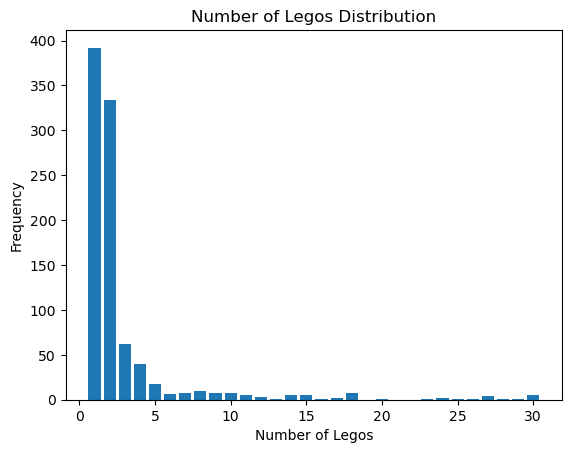

In [23]:
# classes distribution

plt.hist(num_legos, bins=range(1, max(num_legos)), align='left', rwidth=0.8)
plt.xlabel('Number of Legos')
plt.ylabel('Frequency')
plt.title('Number of Legos Distribution')
plt.show()


In [24]:
# TODO: change split strategy

split = np.random.choice([0, 1, 2], len(image_paths), p=[0.8, 0.1, 0.1])

train_indexes = np.where(split == 0)[0]
valid_indexes = np.where(split == 1)[0]
test_indexes = np.where(split == 2)[0]

In [25]:
class LegosDataset(Dataset):
    '''
    Dataset class for the legos dataset
    '''
    def __init__(self, images_filenames, num_legos, transform=None):
        self.images_filenames = images_filenames
        self.transform = transform
        self.labels = num_legos

    def __len__(self):
        return len(self.images_filenames)

    def __getitem__(self, idx):
        image_filename = self.images_filenames[idx]
        label = self.labels[idx]
        image = cv2.imread(image_filename)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = Image.fromarray(image)
        if self.transform is not None:
            image = self.transform(image)

        return image, label

In [26]:
# train, valid and test datasets

batch_size = 32
num_workers = 0
print(len(train_indexes))
print(len(image_paths))
print(len(num_legos))

transform = transforms.Compose([
    transforms.Resize((224, 224)),  
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_dataset = LegosDataset(image_paths[train_indexes], num_legos[train_indexes], transform=transform)
valid_dataset = LegosDataset(image_paths[valid_indexes], num_legos[valid_indexes], transform=transform)
test_dataset = LegosDataset(image_paths[test_indexes], num_legos[test_indexes], transform=transform)

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, num_workers=num_workers, shuffle=True)
valid_dataloader = DataLoader(valid_dataset, batch_size=batch_size, num_workers=num_workers, shuffle=False)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, num_workers=num_workers, shuffle=False)

725
933
933


### Model definition

In [27]:
# get cpu or gpu device for training

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")

Using cpu device


In [28]:
class ConvolutionalNeuralNetwork(nn.Module):
    '''
    CNN for a regression task
    '''
    def __init__(self):
        super(ConvolutionalNeuralNetwork, self).__init__()
        self.layers = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Flatten(),
            nn.Linear(64 * 28 * 28, 128),
            nn.ReLU(),
            nn.Linear(128, 1)
        )

    def forward(self, x):
        logits = self.layers(x)
        return logits

In [29]:
# put model in device

model = ConvolutionalNeuralNetwork().to(device)
print(model)

ConvolutionalNeuralNetwork(
  (layers): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU()
    (8): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (9): Flatten(start_dim=1, end_dim=-1)
    (10): Linear(in_features=50176, out_features=128, bias=True)
    (11): ReLU()
    (12): Linear(in_features=128, out_features=1, bias=True)
  )
)


### Model training

In [30]:
def epoch_iter(dataloader, model, loss_fn, optimizer=None, is_train=True):
    '''
    Function for one epoch iteration
    '''
    if is_train:
        assert optimizer is not None, "When training, please provide an optimizer"
        
    num_batches = len(dataloader)
    
    if is_train:
        model.train()
    else:
        model.eval()
        
    total_loss = 0.0
    preds = []
    labels = []
    
    with torch.set_grad_enabled(is_train):
        for batch, (X, y) in enumerate(tqdm(dataloader)):
            X, y = X.to(device), y.to(device).float() 
            
            pred = model(X)
            loss = loss_fn(pred, y)
            
            if is_train:
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                
            total_loss += loss.item()
            
            preds.extend(pred.view(-1).cpu().detach().numpy())
            labels.extend(y.view(-1).cpu().numpy())
            
    return total_loss / num_batches, np.mean((np.array(labels) - np.array(preds))**2)

In [31]:
def train(model, model_name, num_epochs, train_dataloader, validation_dataloader, loss_fn, optimizer):
    '''
    Function for training the model
    '''
    train_history = {'loss': [], 'accuracy': []}
    val_history = {'loss': [], 'accuracy': []}
    best_val_loss = np.inf
    print("Start training...")
    
    for t in range(num_epochs):
        print(f"Epoch {t+1}/{num_epochs}")
        train_loss, train_acc = epoch_iter(train_dataloader, model, loss_fn, optimizer)
        print(f"Train loss: {train_loss:.3f}, Train accuracy: {train_acc:.3f}")
        val_loss, val_acc = epoch_iter(validation_dataloader, model, loss_fn, is_train=False)
        print(f"Validation loss: {val_loss:.3f}, Validation accuracy: {val_acc:.3f}")
        
        # save model when val loss improves
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            save_dict = {
                'model': model.state_dict(), 
                'optimizer': optimizer.state_dict(),
                'epoch': t
            }
            torch.save(save_dict, model_name + '_best_model.pth')
            
        # save latest model
        save_dict = {
            'model': model.state_dict(), 
            'optimizer': optimizer.state_dict(),
            'epoch': t
        }
        torch.save(save_dict, model_name + '_latest_model.pth')
        
        # save training history
        train_history['loss'].append(train_loss)
        train_history['accuracy'].append(train_acc)
        val_history['loss'].append(val_loss)
        val_history['accuracy'].append(val_acc)
    
    print("Finished")
    return train_history, val_history

In [32]:
# loss function

loss_fn = nn.MSELoss()

In [33]:
# learning rate

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3) # TODO: change optimizer (regression task)

In [34]:
# train model

num_epochs = 50 # TODO: change number of epochs to 50 or so (low value is for testing)

train_history, val_history = train(model, 'lego_counter', num_epochs, train_dataloader, valid_dataloader, loss_fn, optimizer)

Start training...
Epoch 1/50


 30%|███       | 7/23 [00:39<01:28,  5.55s/it]

In [ ]:
# show a series of images and their predictions

def showPredictions(model, dataloader, num_images=5):
    



Dataset    Loss       Accuracy  
Train      5.414      0.821     
Validation 21.709     0.780     
Test       21.954     0.809     


### Training evolution analysis

In [ ]:
def plotTrainingHistory(train_history, val_history):
    '''
    Plot the training history of the model
    '''
    plt.subplot(2, 1, 1)
    plt.title('Cross Entropy Loss')
    plt.plot(train_history['loss'], label='train')
    plt.plot(val_history['loss'], label='val')
    plt.legend(loc='best')

    plt.subplot(2, 1, 2)
    plt.title('Classification Accuracy')
    plt.plot(train_history['accuracy'], label='train')
    plt.plot(val_history['accuracy'], label='val')

    plt.tight_layout()
    plt.legend(loc='best')
    plt.show()

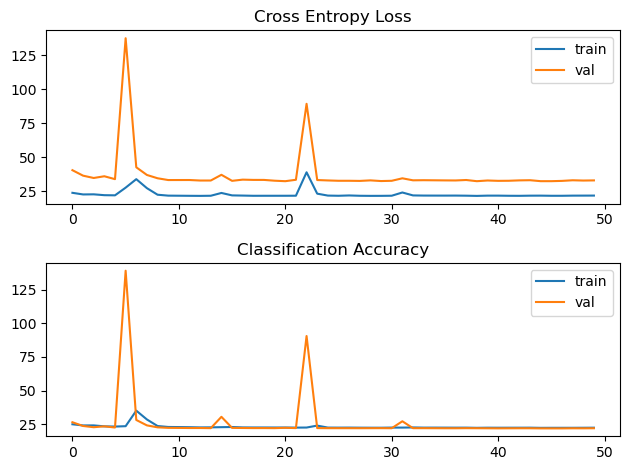

In [ ]:
# visualize training history

plotTrainingHistory(train_history, val_history)

### Model testing

In [ ]:
# load best model

model = ConvolutionalNeuralNetwork().to(device)
checkpoint = torch.load('lego_counter_best_model.pth')
model.load_state_dict(checkpoint['model'])

<All keys matched successfully>

In [ ]:
# evaluate model on test data

test_loss, test_acc = epoch_iter(test_dataloader, model, loss_fn, is_train=False)
print(f"Test loss: {test_loss:.3f}, Test accuracy: {test_acc:.3f}")

 67%|██████▋   | 2/3 [00:09<00:04,  4.64s/it]c:\Users\Henrique\anaconda3\Lib\site-packages\torch\nn\modules\loss.py:535: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
100%|██████████| 3/3 [00:14<00:00,  4.82s/it]

Test loss: 6.922, Test accuracy: 6.816


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


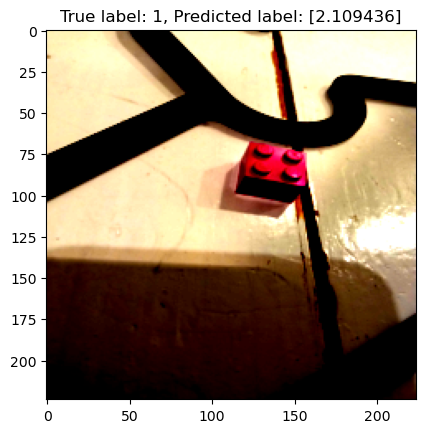

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


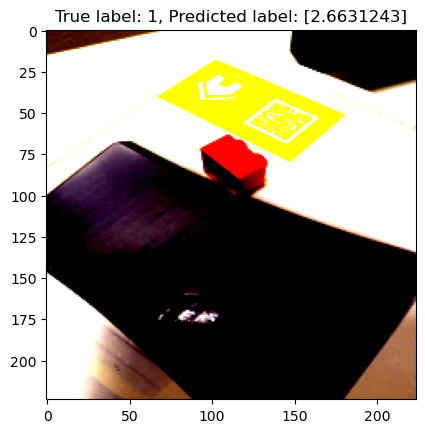

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


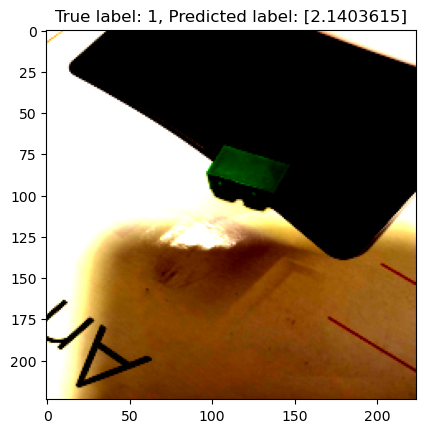

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


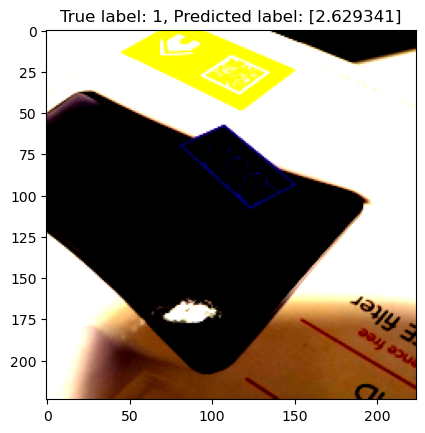

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


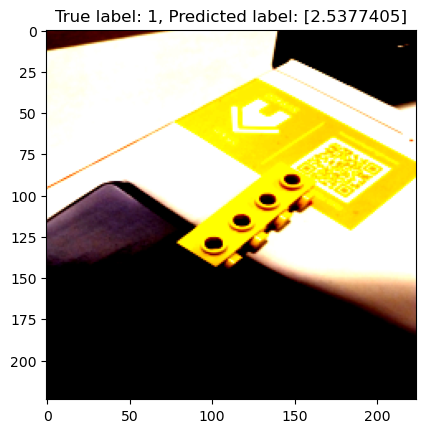

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


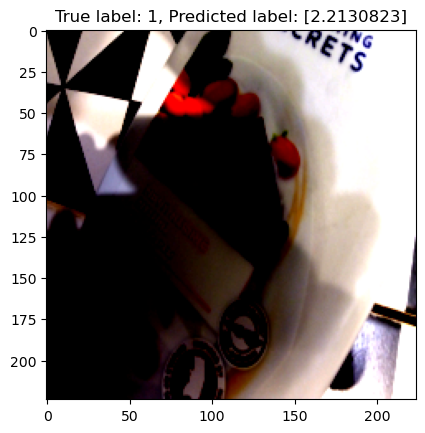

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


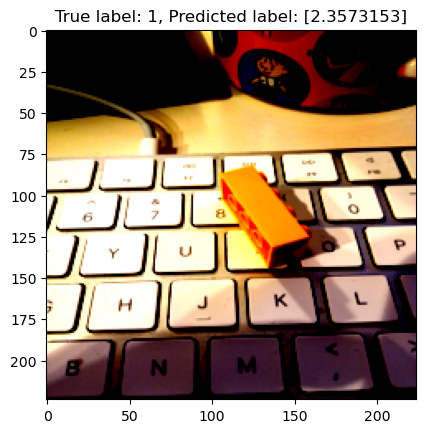

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


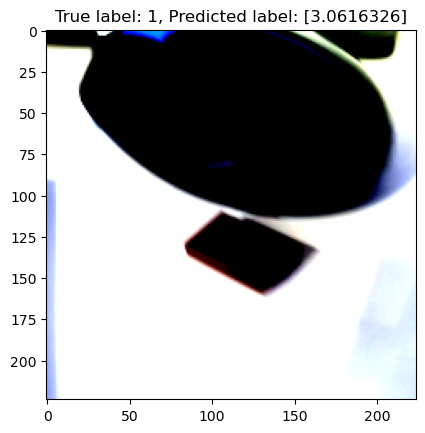

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


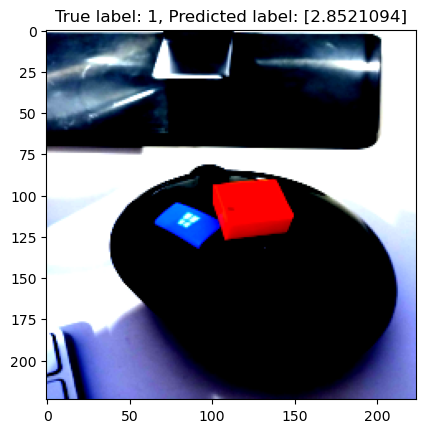

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


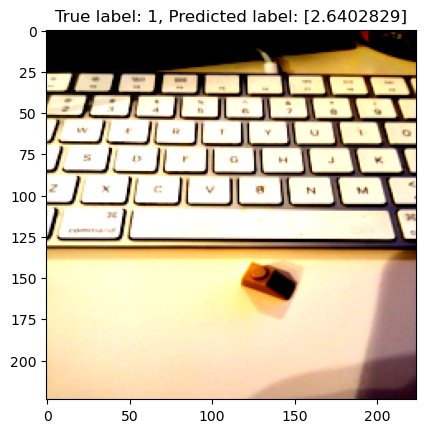

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


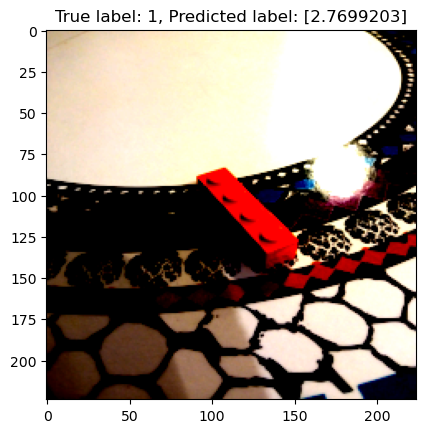

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


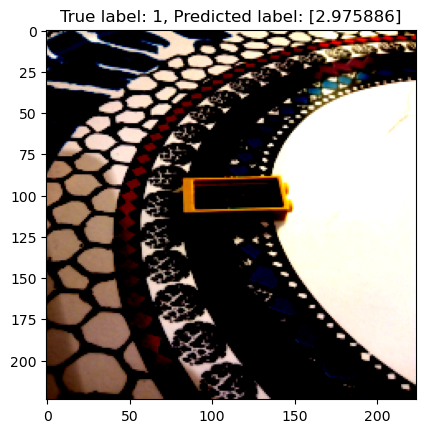

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


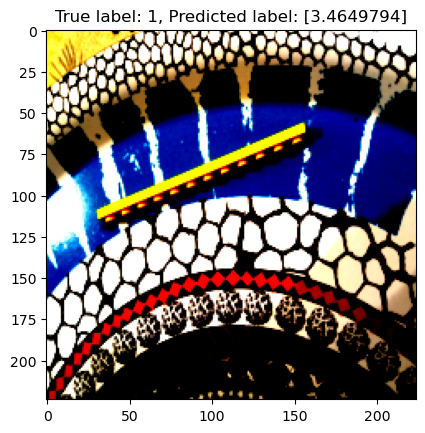

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


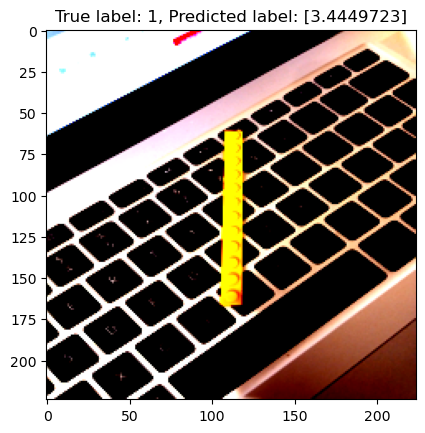

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


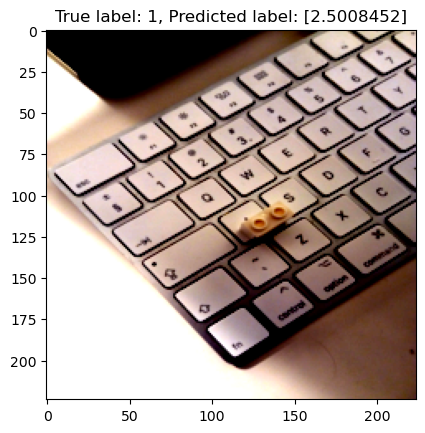

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


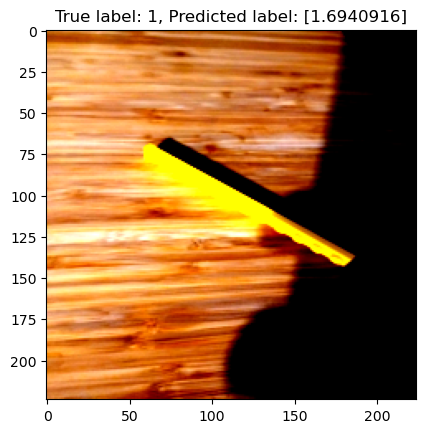

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


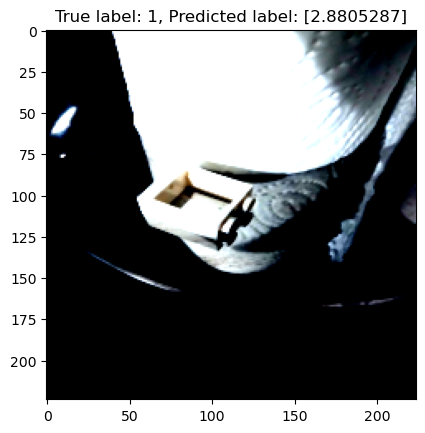

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


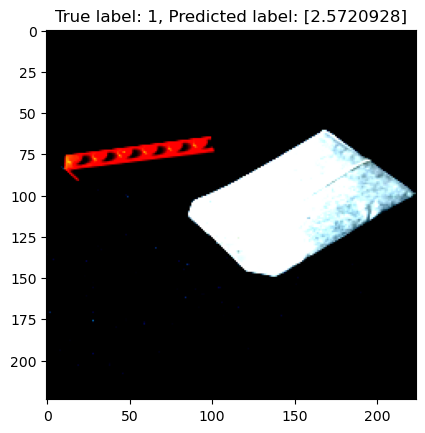

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


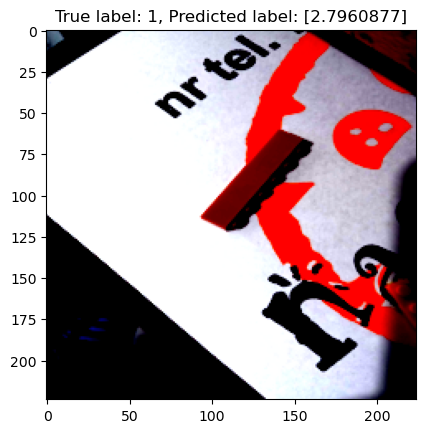

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


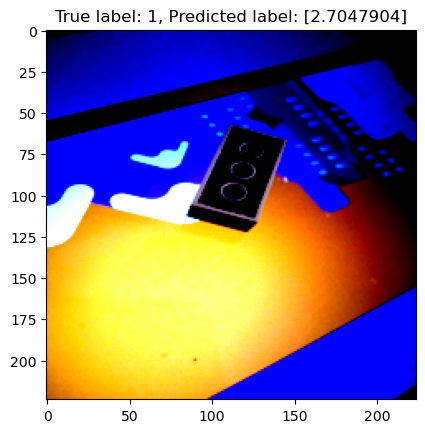

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


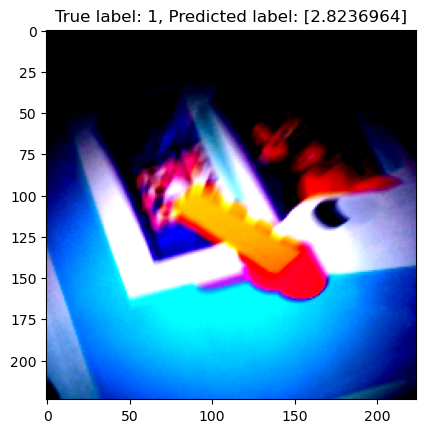

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


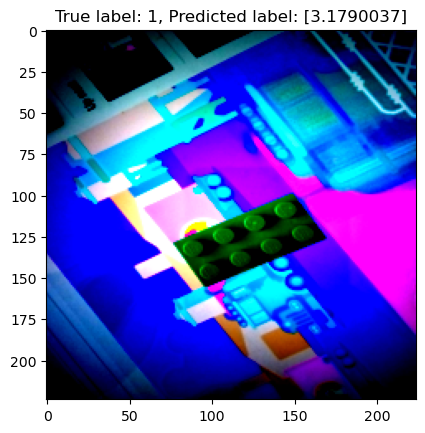

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


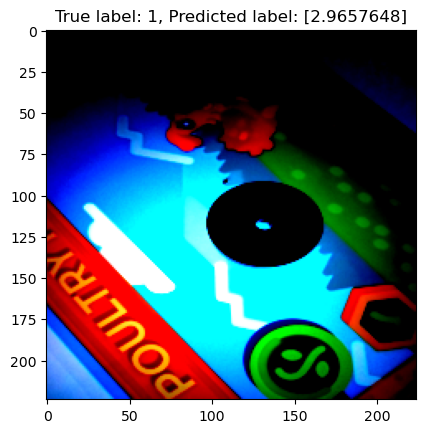

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


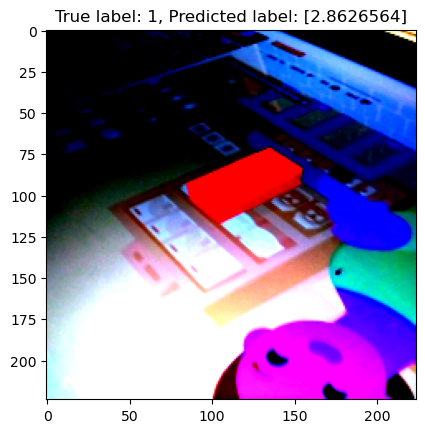

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


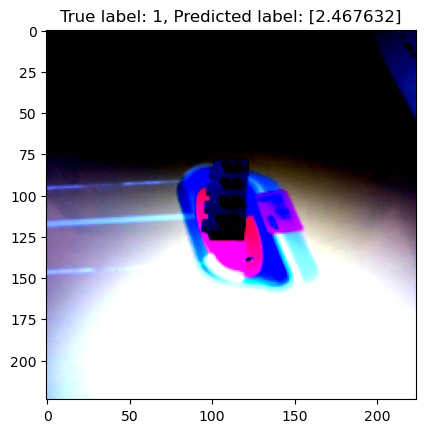

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


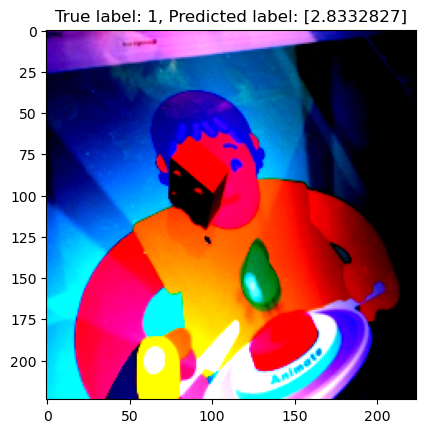

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


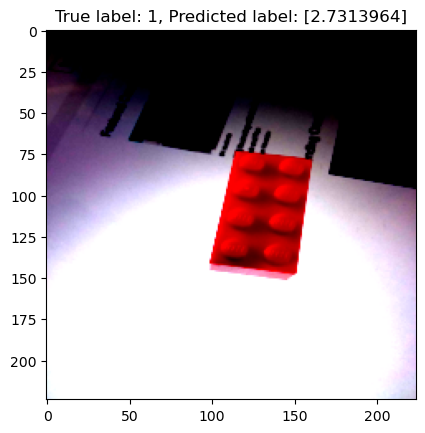

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


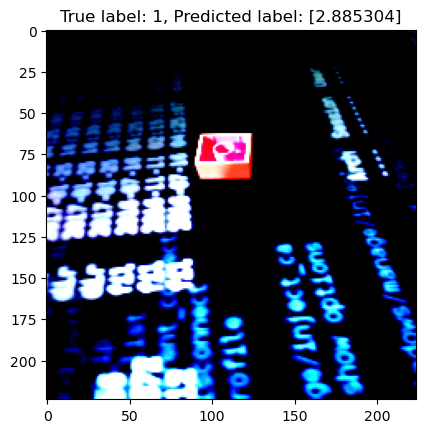

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


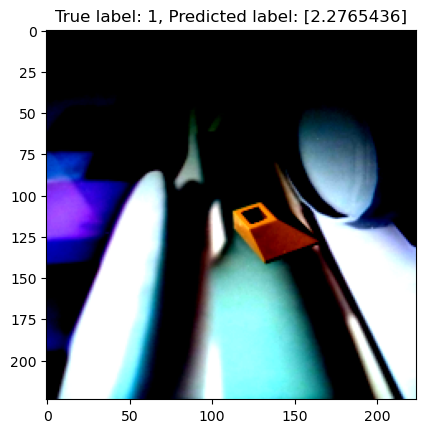

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


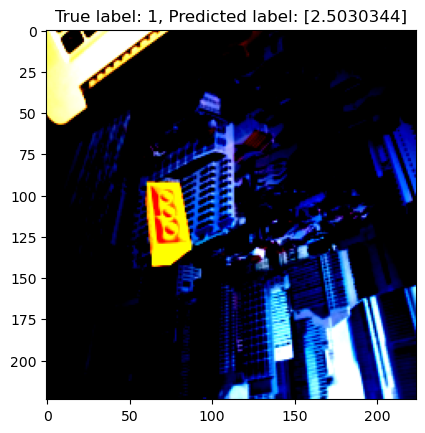

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


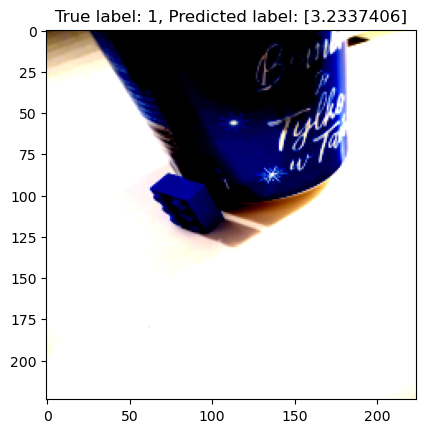

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


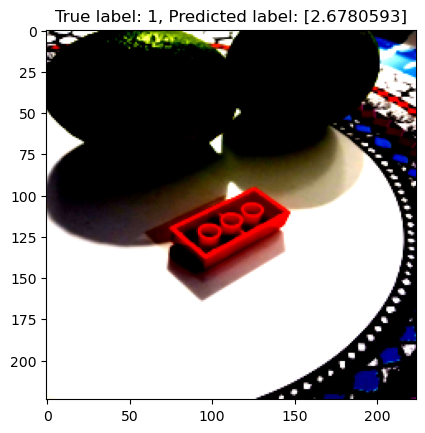

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


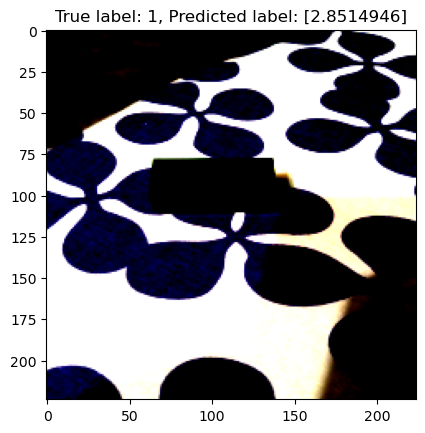

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


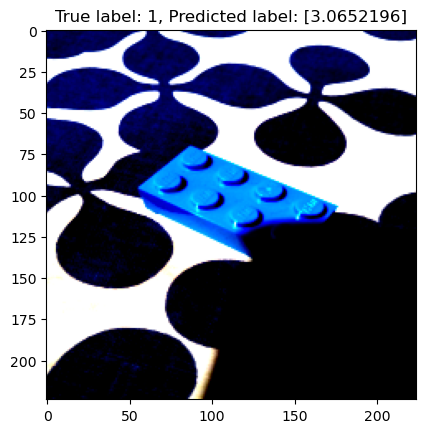

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


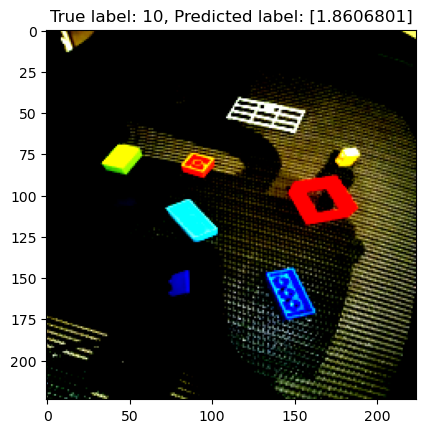

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


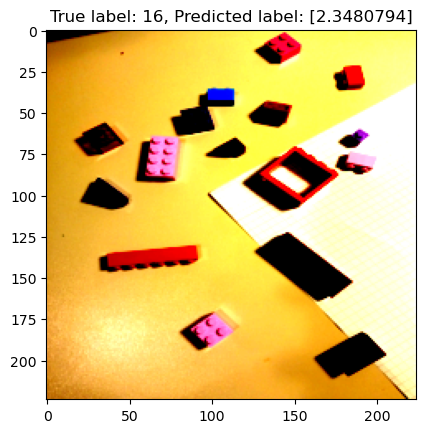

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


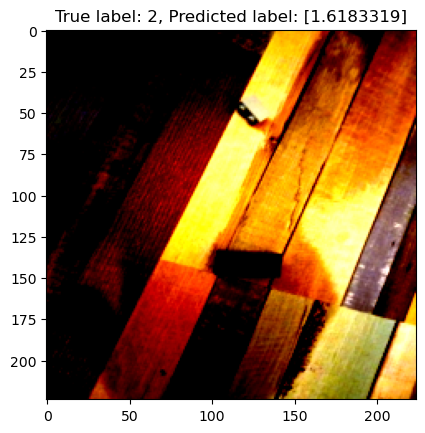

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


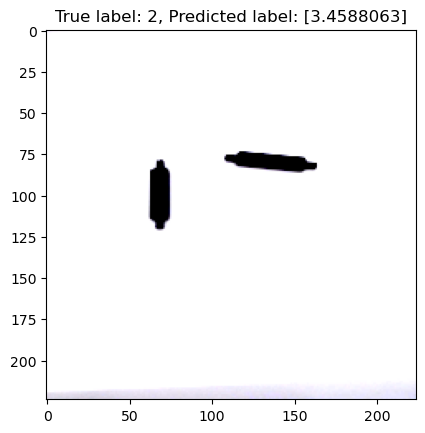

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


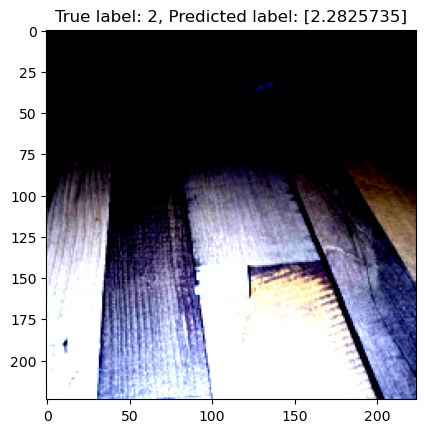

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


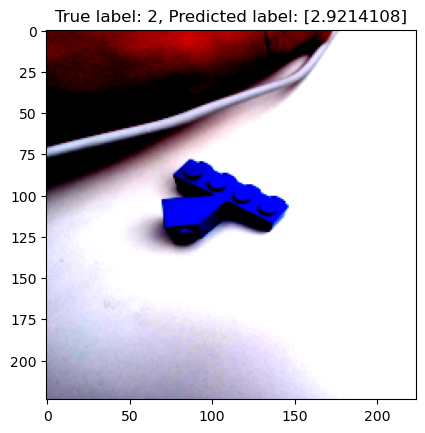

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


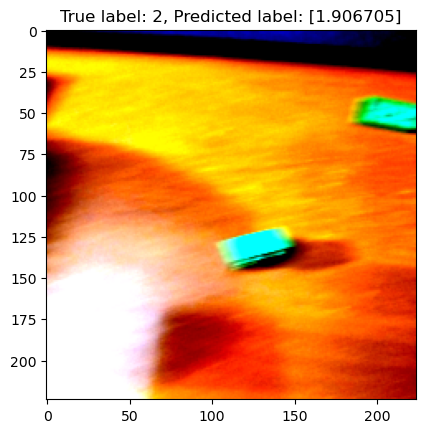

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


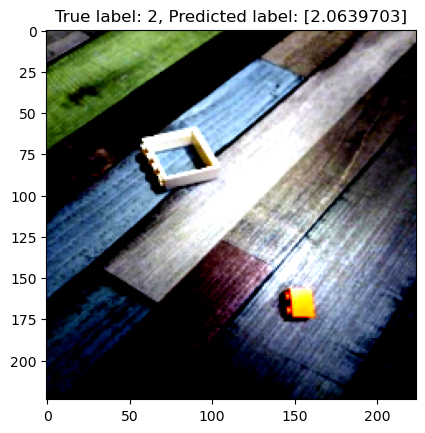

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


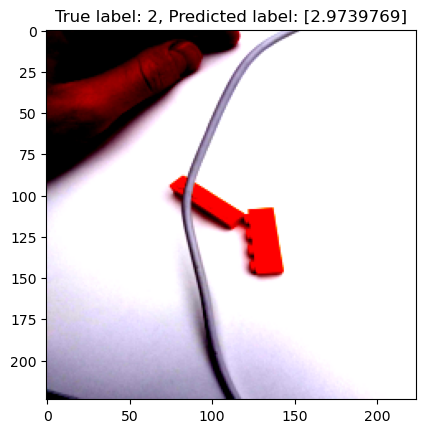

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


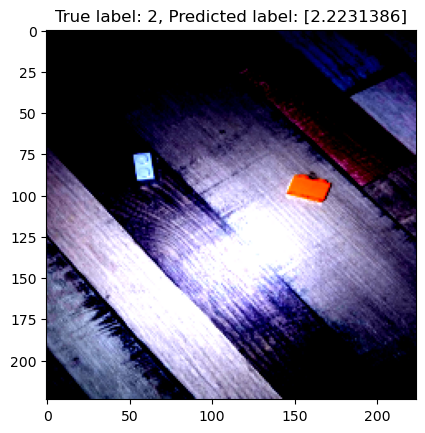

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


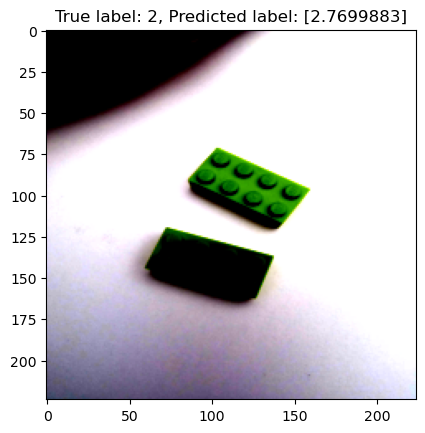

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


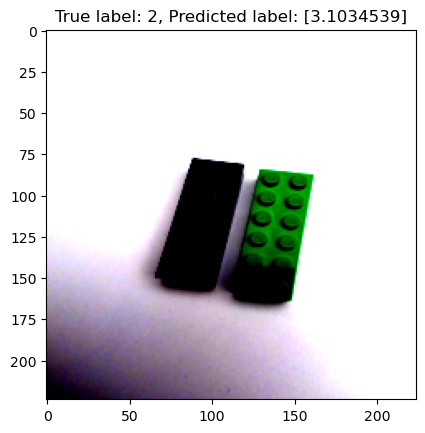

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


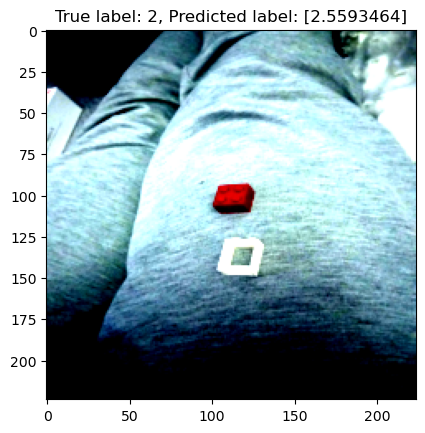

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


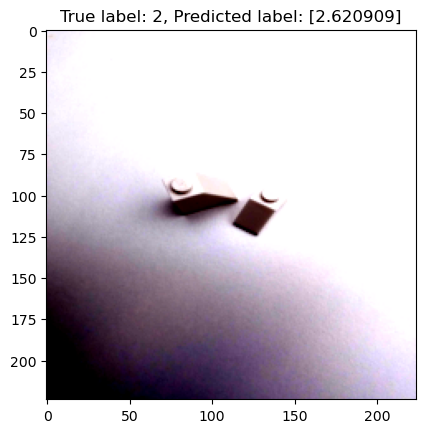

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


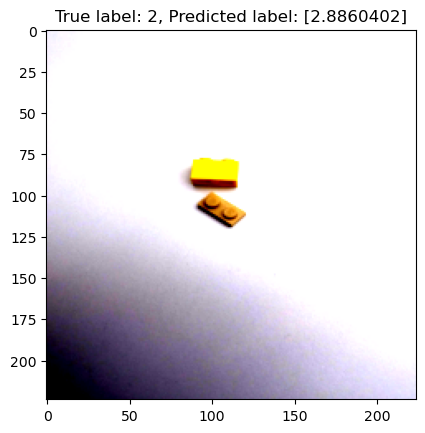

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


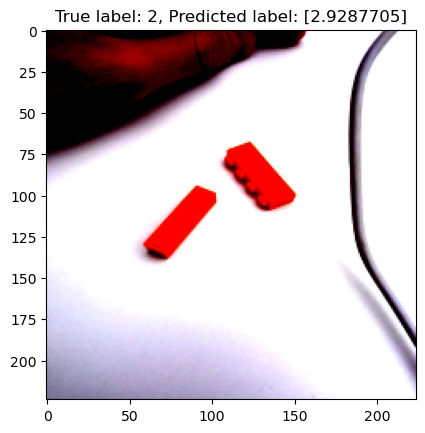

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


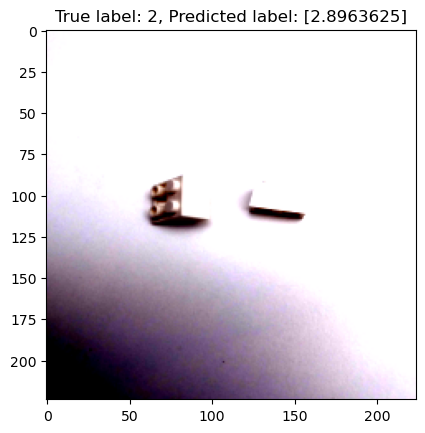

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


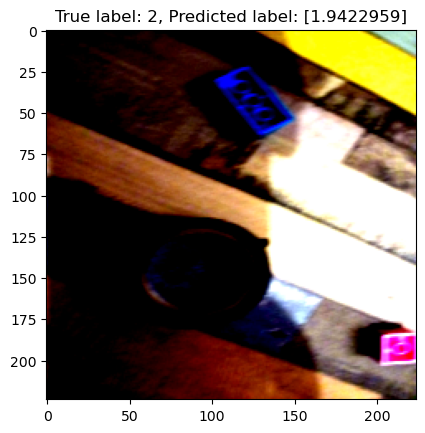

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


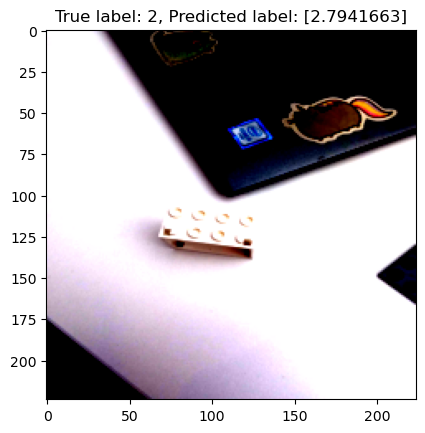

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


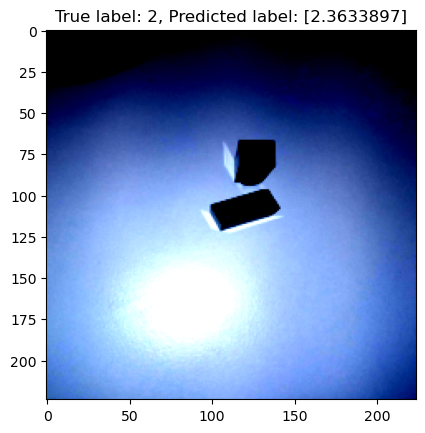

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


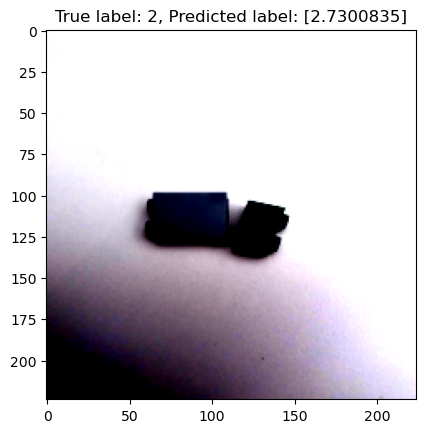

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


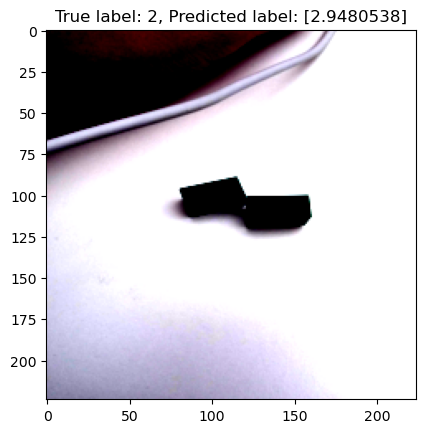

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


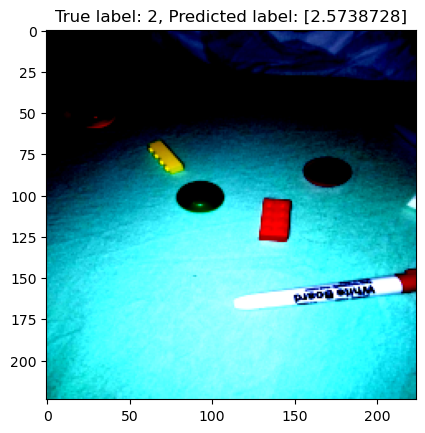

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


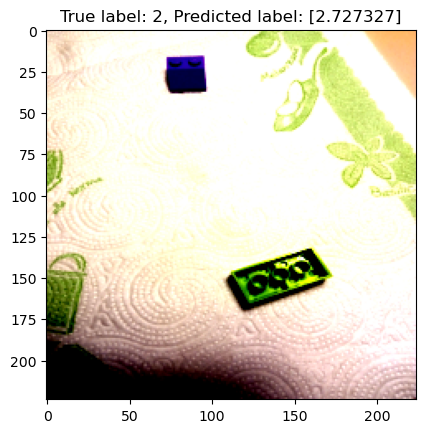

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


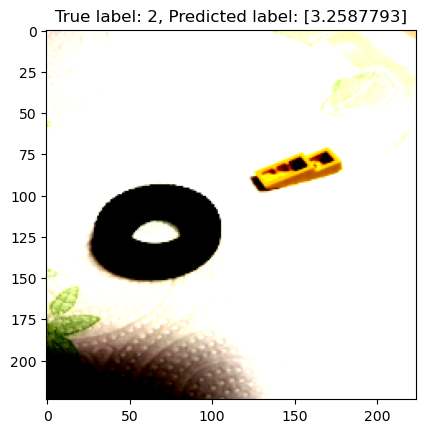

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


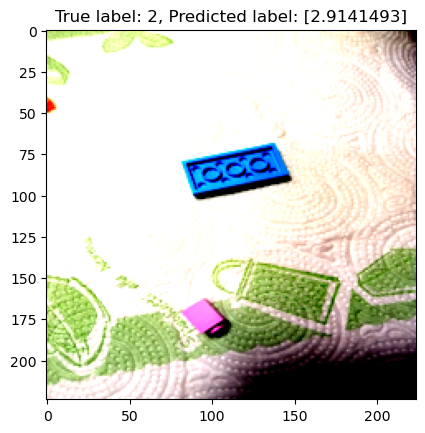

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


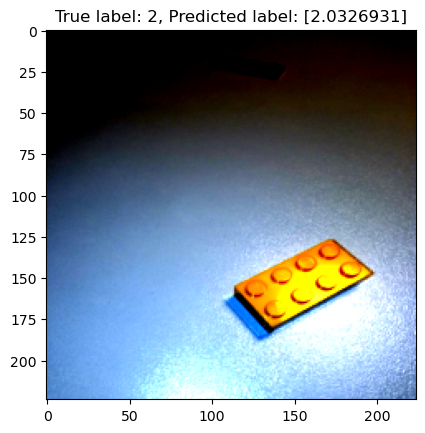

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


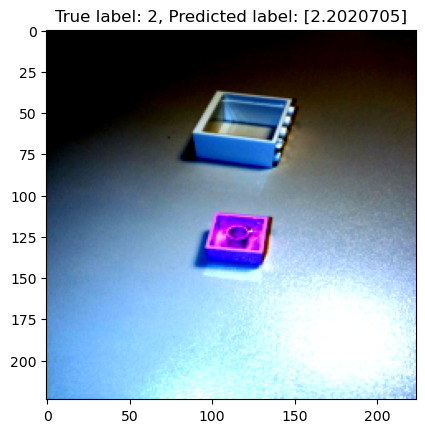

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


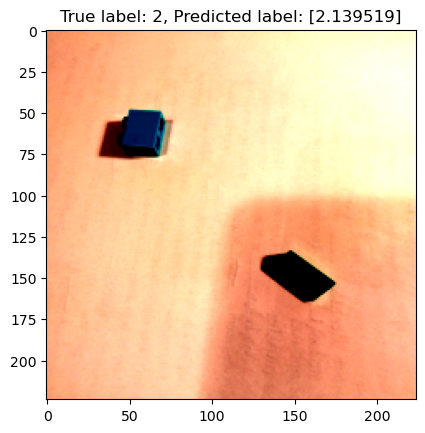

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


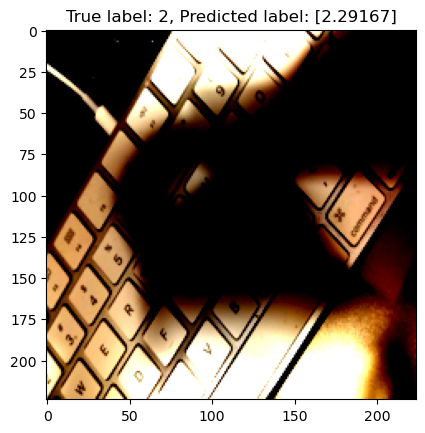

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


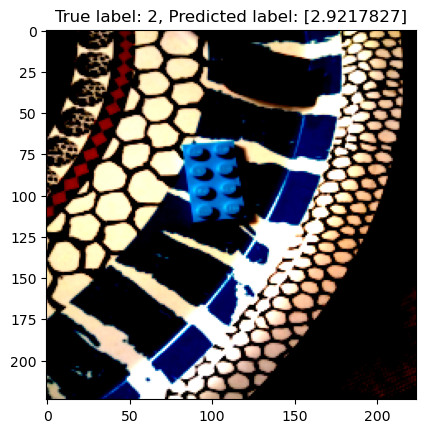

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


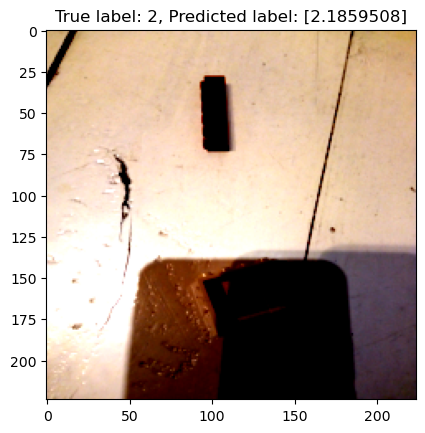

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


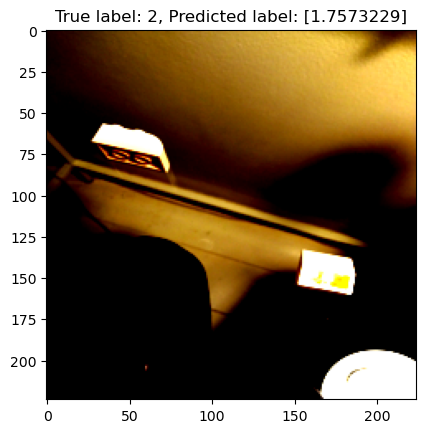

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


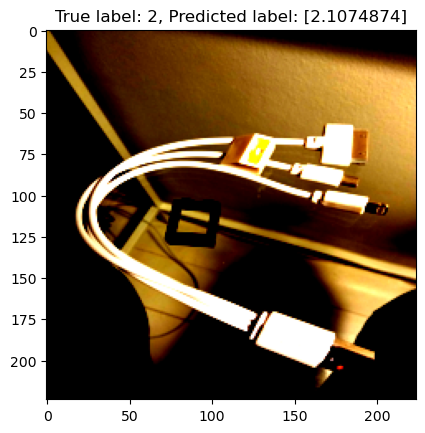

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


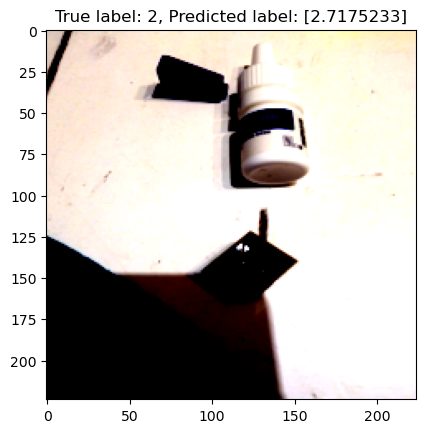

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


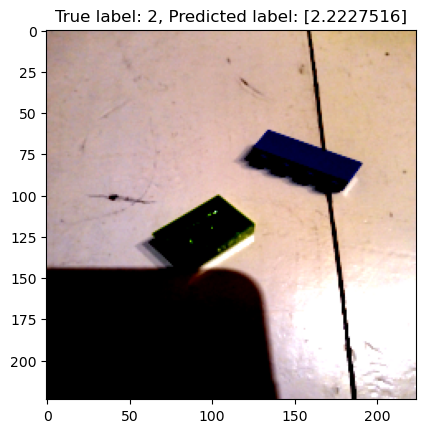

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


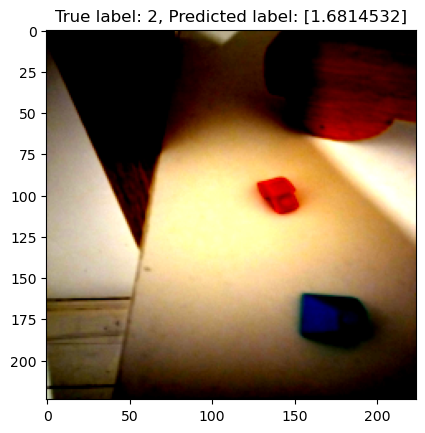

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


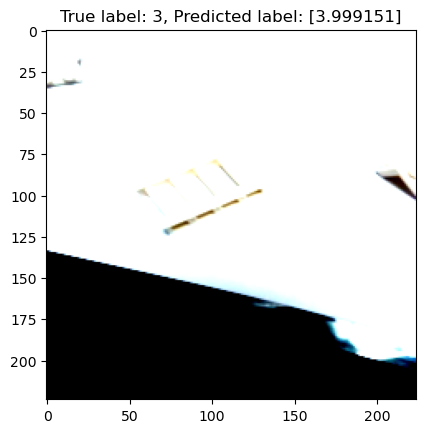

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


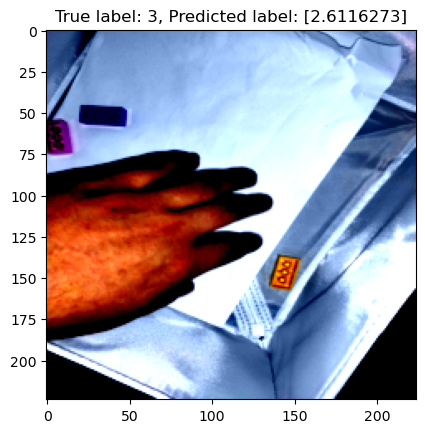

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


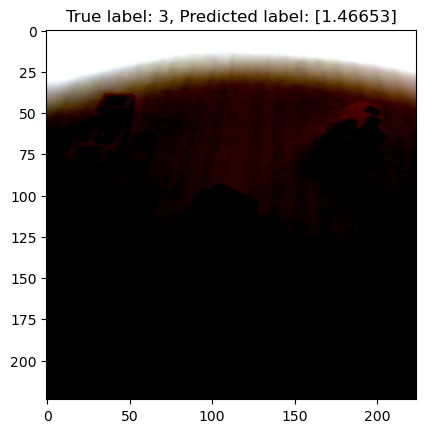

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


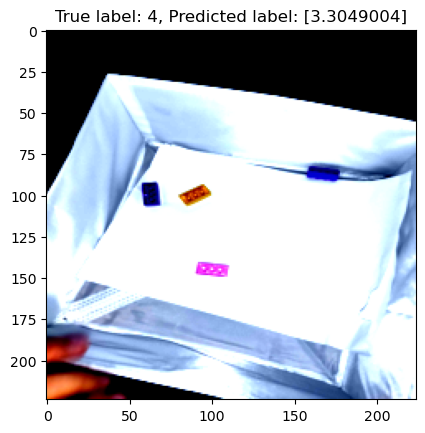

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


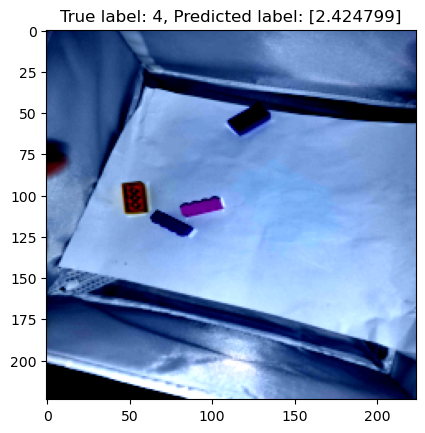

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


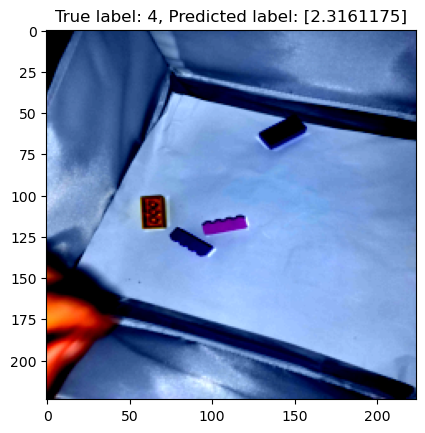

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


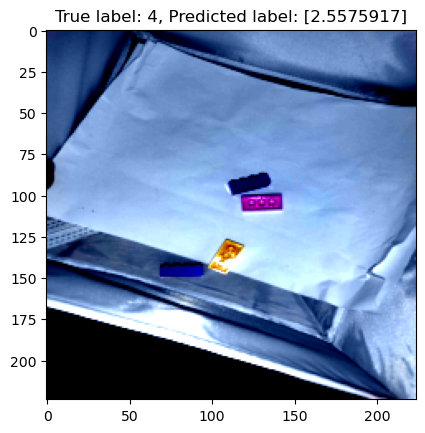

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


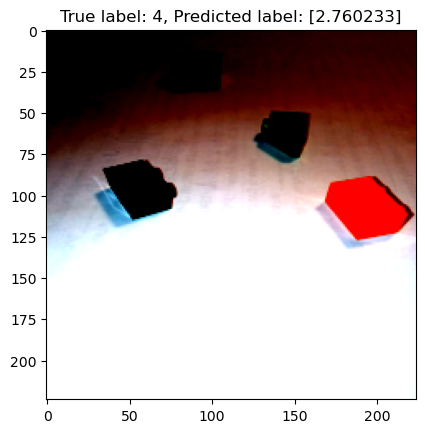

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


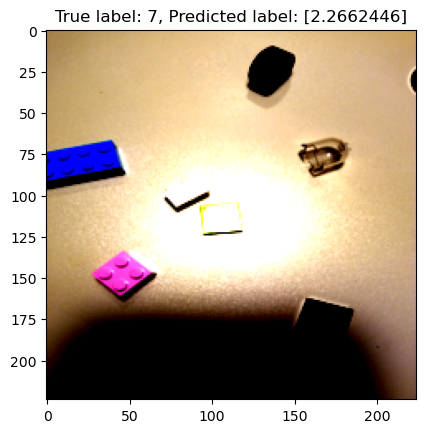

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


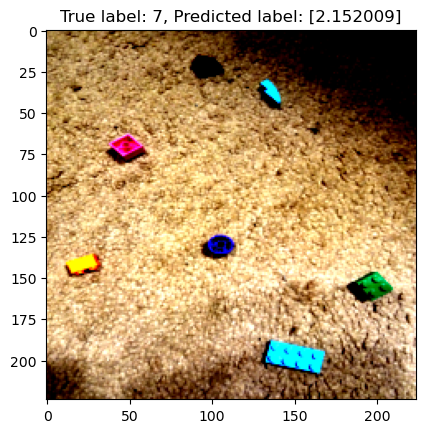

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


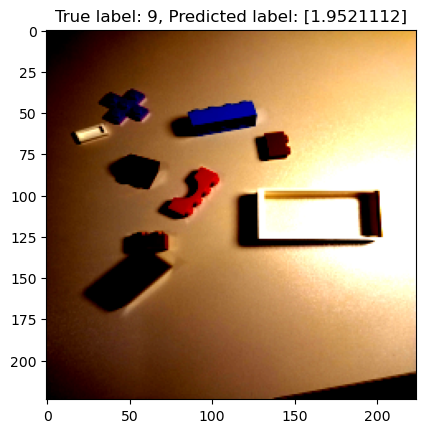

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


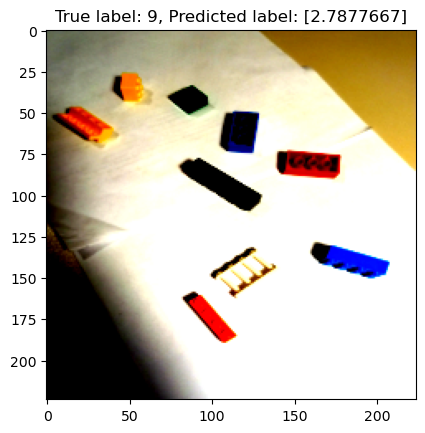

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


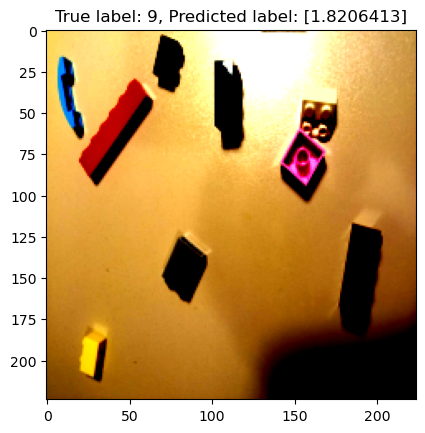

In [ ]:
def show_predictions(model, dataloader):
    model.eval()  # Set the model to evaluation mode
    all_preds = []
    all_labels = []
    all_images = []

    with torch.no_grad():  # Disable gradient calculation
        for images, labels in dataloader:  # Iterate over the entire DataLoader
            images, labels = images.to(device), labels.to(device)
            preds = model(images)  # Run the model on the images
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_images.extend(images.cpu().numpy())

    # Display the images along with their true and predicted labels
    for i in range(len(all_images)):
        plt.imshow(all_images[i].transpose((1, 2, 0)))
        plt.title(f'True label: {all_labels[i]}, Predicted label: {all_preds[i]}')
        plt.show()

show_predictions(model, test_dataloader)